# Introduction/ Welcome word.

Hi!

In this project I focused on conducting **statistical modelling with Python**. This project is aimed at creating *reliable* statistical models for **regression and classification** tasks.

For this purpose I worked with a Red Wine Quality dataset, which is a .csv file with 12 different attributes of Red Wine. [Link to the Dataset](https://www.kaggle.com/datasets/uciml/red-wine-quality-cortez-et-al-2009)

<span style="font-size: larger;">**Project Problem:**</span>

Wine can be described in so many different attributes. However, finding the ones that most accurately describe its quality and alcohol levels sometimes cause a real challenge.

<span style="font-size: larger;">**Proposed Solution:**</span>

By implementing EDA, Statistical Modelling techniques - come up with reasonable statistical models in order to accurately predict wine alcohol levels and classify its quality.


# Project approach/ objectives.

My approach to this project follows a structured, step-by-step methodology grounded in
data science best practices. Each stage is thoughtfully designed to build upon the previous,
ensuring a cohesive and comprehensive solution:

1. **Understand the Data.**  The first step involves a thorough understanding of the dataset, its
variables, and its structure. This step is crucial for shaping the subsequent stages of the project.


2. **Data Preprocessing.**  After understanding the dataset, we clean and preprocess the data.


3. **Exploratory Data Analysis.** With selected features (based on domain knowledge and how they fit) this stage covers unearthing patterns, spotting anomalies, checking assumptions through visual and quantitative methods. It provides an in-depth understanding of the variables and their interrelationships.


4. **Hypothesis testing.** After Data Analysis is completed, most interesting patterns will be thoroughly investigated using stastitical inference approach.


5. **Predictive Modelling.** Main objective and most important part of this project. This involves selecting features, creating, selecting, interpreting models.


6. **Presentation of dashboard.** This includes Google Looker Studio dashboard for relevant information about Red Wine Quality;

# Standards and Assumptions.

1. Since our variables of interest are **quality** and **alcohol**, EDA, hypothesis testing parts will also be centered around them.


2. Due to large sample size some of the hypothesis will be tested assuming Central Limit Theorem for the data.


3. All statistical inferences will be conducted with a 95% confidence, so we will expect that corresponding p-value will be lower than the condidence level α = 0.05.

4. Many other things could have been employed (like k-folds cross validation), AutoML or etc.. However approach that I used in this project is subject to the learning material. More extensive Statistical Modelling will be performed in the M2 Capstone project.

# Most Important Statistical Concepts used throughout the project:


1. **Central Limit Theorem.**  When you collect many random samples from a population, calculate the means of these samples, and plot the distribution of those means, the resulting distribution will be approximately normally distributed, regardless of the shape of the original population distribution


2. **Multicolinearity.**  Presence of perfect or near-perfect correlation between independend variables.


3. **Homoskedasticity.**  Presence of constant variance between Residuals.


4. **R-squared.**  Determination Coefficient (Proportion of explained variance).


5. **Standard Deviation.**  Quantifies the variation within a set of measurements.


6. **Standard Error.**  Quantifies variation in the means from multiple sets of measurements.


7. **Variance Inflation Factor.** Will be abbreviated as VIF. When VIF > 4, it means there is multicollinearity.

**Assumptions of a linear regression:**


1. There must be a linear relationship between X and Y.

2. There is no multicolinearity between regressors (VIF will be employed).

3. Mean of the residuals is close to 0.

4. Residuals are normally distributed (Shapiro-Wilk statistics or visual).

5. Residuals have a constant variance (Breusch-Pagan criterion or visual).


**Linear Regression Model will be considered as good fit when:**

1. R-squared will be >= 0.20.

2. p-value of t-statistics for all predictor features  < 0.05.

3. There is no violation of any of linear regression assumptions.

# Data Preprocessing.

This section involves:
* **Data Collection** (Importing necessary libraries, retrieving the dataset, reading the dataset in the Pandas DataFrame);
* **Data Understanding** (descriptive statistics, purpose of different features);
* **Data Cleaning.**

## Data Collection.

In [2]:
# Importing all necessary libraries and packages;
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
import sqlite3
from pandas_profiling import ProfileReport
from scipy.stats import chi2_contingency
from scipy.stats import ttest_ind
import statsmodels.api as sm
import scipy.stats.distributions as dist
import warnings
import re
import pathlib
%matplotlib inline
import warnings
warnings.filterwarnings("ignore")

In [9]:
path = pathlib.Path(
    r"/winequality-red.csv")
df = pd.read_csv(path)
df.head(2)

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,quality
0,7.4,0.70,0.0,1.9,0.076,11.0,34.0,0.9978,3.51,0.56,9.4,5
1,7.8,0.88,0.0,2.6,0.098,25.0,67.0,0.9968,3.20,0.68,9.8,5


## Data Understanding.

**First let's try to categorize features in order to know how they are possibly interrelated in wine-making process**

1. **Acid Levels**: Fixed Acidity and pH are tend to be inversely related. Other features are presumed to work independent of each other.
* Fixed Acidity.
* Volatile Acidity.
* Citric Acid.
* pH.


2. **Sulfur Dioxide Levels.**: Total amount is a sum of Free Sulfur Dioxide and Bound Sulfur Dioxide so *Free Sulfur Dioxide* might be redundant feature.
* Free Sulfur Dioxide.
* Total Sulfur Dioxide.


3. **Sugar and Alcohol Content**. There tends to be inverse relationship between these two. These two will have to be throroughly investigated.
* Residual Sugar.
* Alcohol.


4. **Other**:
* Chlorides.
* Sulphates.
* Density.
* Quality.


In [4]:
# Code
def summary(df):
    print(f'Dataframe shape: {df.shape}')
    summ = pd.DataFrame(df.dtypes, columns=['data type'])
    summ['#unique'] = df.nunique().values
    summ['missing'] = df.isna().sum()
    desc = pd.DataFrame(df.describe(include='all').transpose())
    summ['min'] = desc['min'].values
    summ['max'] = desc['max'].values
    summ['mean'] = desc['mean'].values
    summ['median'] = df.median().values
    summ['standard_deviation'] = desc['std'].values

    return summ

summary(df).style.background_gradient(cmap='cividis')

Dataframe shape: (1599, 12)


,data type,#unique,missing,min,max,mean,median,standard_deviation
fixed acidity,float64,96,0,4.600000,15.900000,8.319637,7.900000,1.741096
volatile acidity,float64,143,0,0.120000,1.580000,0.527821,0.520000,0.179060
citric acid,float64,80,0,0.000000,1.000000,0.270976,0.260000,0.194801
residual sugar,float64,91,0,0.900000,15.500000,2.538806,2.200000,1.409928
chlorides,float64,153,0,0.012000,0.611000,0.087467,0.079000,0.047065
free sulfur dioxide,float64,60,0,1.000000,72.000000,15.874922,14.000000,10.460157
total sulfur dioxide,float64,144,0,6.000000,289.000000,46.467792,38.000000,32.895324
density,float64,436,0,0.990070,1.003690,0.996747,0.996750,0.001887
pH,float64,89,0,2.740000,4.010000,3.311113,3.310000,0.154386
sulphates,float64,96,0,0.330000,2.000000,0.658149,0.620000,0.169507


**Initial insights on the features:**
1. All features are numeric (except for quality - its ordinal categorical feature) and none of them has null values.
1. **Free sulfur dioxide and total sulfur dioxide** have high standard deviations. This could cause some issues while creating significant statistical models;
2. **Density, pH, Chlorides**: all have very low standard deviations and seem to have very symmetric distributions.

## Data Cleaning.

Let's create a copy of the original dataset.

In [10]:
df1 = df.copy()

Let's check for duplicated rows and handle this issue.

In [11]:
df.duplicated().sum()

240

In [12]:
df[df.duplicated(keep=False)].head(5)

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,quality
0,7.4,0.70,0.00,1.9,0.076,11.0,34.0,0.9978,3.51,0.56,9.4,5
4,7.4,0.70,0.00,1.9,0.076,11.0,34.0,0.9978,3.51,0.56,9.4,5
9,7.5,0.50,0.36,6.1,0.071,17.0,102.0,0.9978,3.35,0.80,10.5,5
11,7.5,0.50,0.36,6.1,0.071,17.0,102.0,0.9978,3.35,0.80,10.5,5
22,7.9,0.43,0.21,1.6,0.106,10.0,37.0,0.9966,3.17,0.91,9.5,5


In [13]:
df = df.drop_duplicates()

In [14]:
df1.shape

(1599, 12)

In [15]:
df.shape

(1359, 12)

**We've dropped 240 rows because they were duplicated.**

# Exploratory Data Analysis.

In this part I will analyze the main characteristics of the data. Purpose of it - prepare data and gain knowledge about features prior creating statistical models.

**First let's take a look at the Profiling Report. This let's to first get in touch with the dataset and get to know what are the underlying issues**.

In [16]:
profile = ProfileReport(df, title="Profiling Report", explorative=True)

profile

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

## Analysis of feature distribution.

First let's take a look at the histograms of each feature and find out how distributed they are.

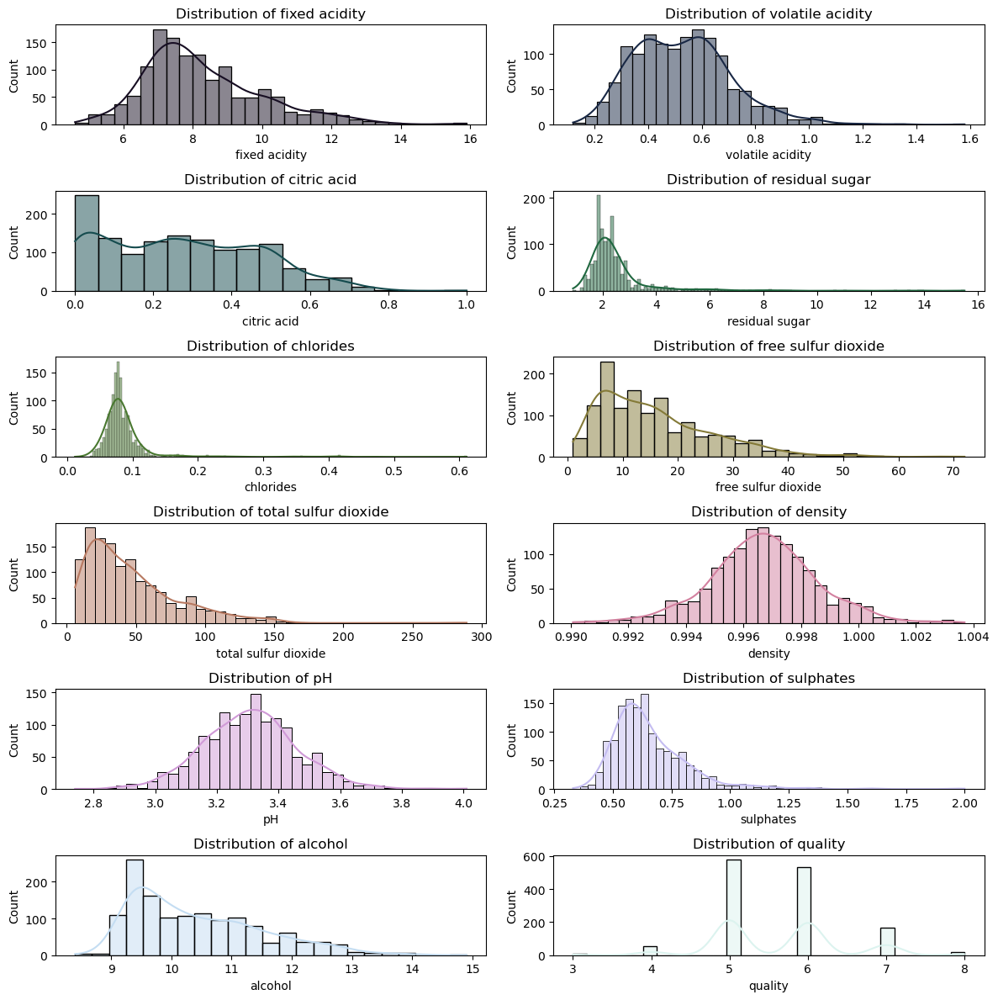

In [61]:
# Code is here
num_columns = len(df.columns)

num_rows = (num_columns + 1) // 2  

fig, axes = plt.subplots(num_rows, 2, figsize=(12, 2 * num_rows))

axes = axes.flatten()
colors = sns.color_palette('cubehelix', num_columns)
for i, column in enumerate(df.columns):
    ax = axes[i]
    sns.histplot(data=df, x=column, ax=ax, kde=True, color=colors[i])
    ax.set_title(f'Distribution of {column}')

plt.tight_layout()

plt.show()

**Interesting! Many of the histograms are right skewed, while some of them look normally distributed. It means that most of the data points are closer to their minimum rather than the maximum in their respective intervals.** 

Although in real life situations it's very hard to find normally distributed features, let's calculate Jarque-Bera test statistic and its probability to determine if any of the features are normally (Gaussian) distributed.

![study](https://excelrcom.b-cdn.net/assets/admin/ckfinder/userfiles/images/tableau1/tableau2/tableau3/tableau4/tableau5/tableau6/skewness-kurtosis_1JPG-.jpg)

For the Jarque-Bera test (it uses skewness and kurtosis) hypothesis are formed the following way:

**Target Population**: Individual Features in the Wine Quality Dataset.  

**Parameter of Interest**: $p$ value. 

**Null Hypothesis:** $p$ > 0.05, data follows a normal distribution. 

**Alternative Hypthosis:** $p$ < 0.05, data does not follow a Gaussian distribution. 

In [64]:
# Code is here
for column in df.columns:
    jb_stat = sm.stats.jarque_bera(df[column])
    print(f'Feature: {column}')
    print(f'Jarque-Bera Test Statistic: {jb_stat[0]:.2f}')
    print(f'p-value: {jb_stat[1]:.4f}')
    print('-' * 30)

Feature: fixed acidity
Jarque-Bera Test Statistic: 261.55
p-value: 0.0000
------------------------------
Feature: volatile acidity
Jarque-Bera Test Statistic: 207.30
p-value: 0.0000
------------------------------
Feature: citric acid
Jarque-Bera Test Statistic: 57.48
p-value: 0.0000
------------------------------
Feature: residual sugar
Jarque-Bera Test Statistic: 53128.66
p-value: 0.0000
------------------------------
Feature: chlorides
Jarque-Bera Test Statistic: 90680.42
p-value: 0.0000
------------------------------
Feature: free sulfur dioxide
Jarque-Bera Test Statistic: 540.43
p-value: 0.0000
------------------------------
Feature: total sulfur dioxide
Jarque-Bera Test Statistic: 1452.68
p-value: 0.0000
------------------------------
Feature: density
Jarque-Bera Test Statistic: 38.82
p-value: 0.0000
------------------------------
Feature: pH
Jarque-Bera Test Statistic: 55.24
p-value: 0.0000
------------------------------
Feature: sulphates
Jarque-Bera Test Statistic: 8231.72
p-va

**Interesting, Jarque-Bera Test results indicates that none of the features are normally distributed and we fail to reject Null hypothesis here.** 

Now let's take a look at the Q-Q plots to investigate each feature;

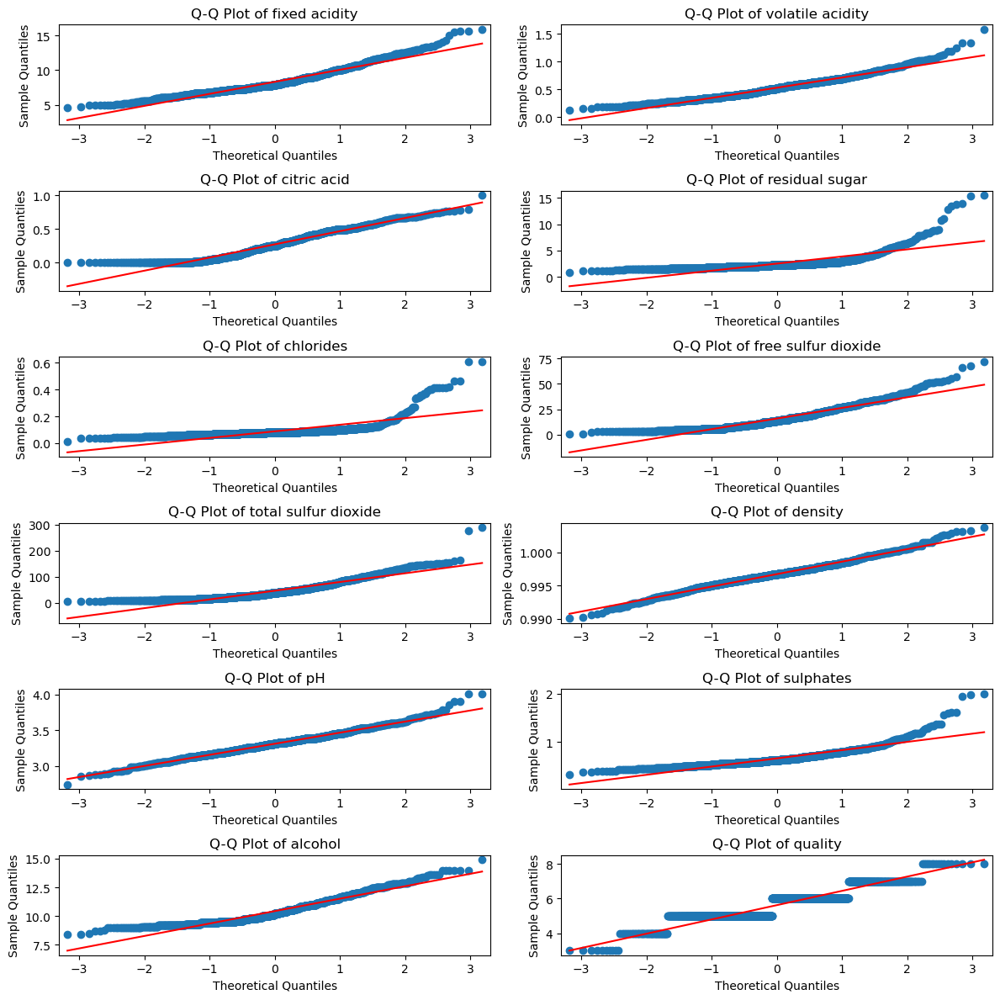

In [68]:
# Code is here
fig, axes = plt.subplots(num_rows, 2, figsize=(12, 2 * num_rows))

axes = axes.flatten()
colors = sns.color_palette('cubehelix', num_columns)

for i, column in enumerate(df.columns):
    ax = axes[i]
    
    # Create a Q-Q plot
    sm.qqplot(df[column], line='s', ax=ax)
    ax.set_title(f'Q-Q Plot of {column}')
    
plt.tight_layout()
plt.show()

In real-life projects, when working with econometrical or medical data it would be useful to transform features.

However, since all of the features are **nearly normally distributed** no transformation for them will be conducted.

## Analysis of linear relationship between features.

One of the main assumptions of linear regression is that there is a linear relationship between the dependent and independent features. To check for this assumption, we can create a scatter plot and add a regression line.

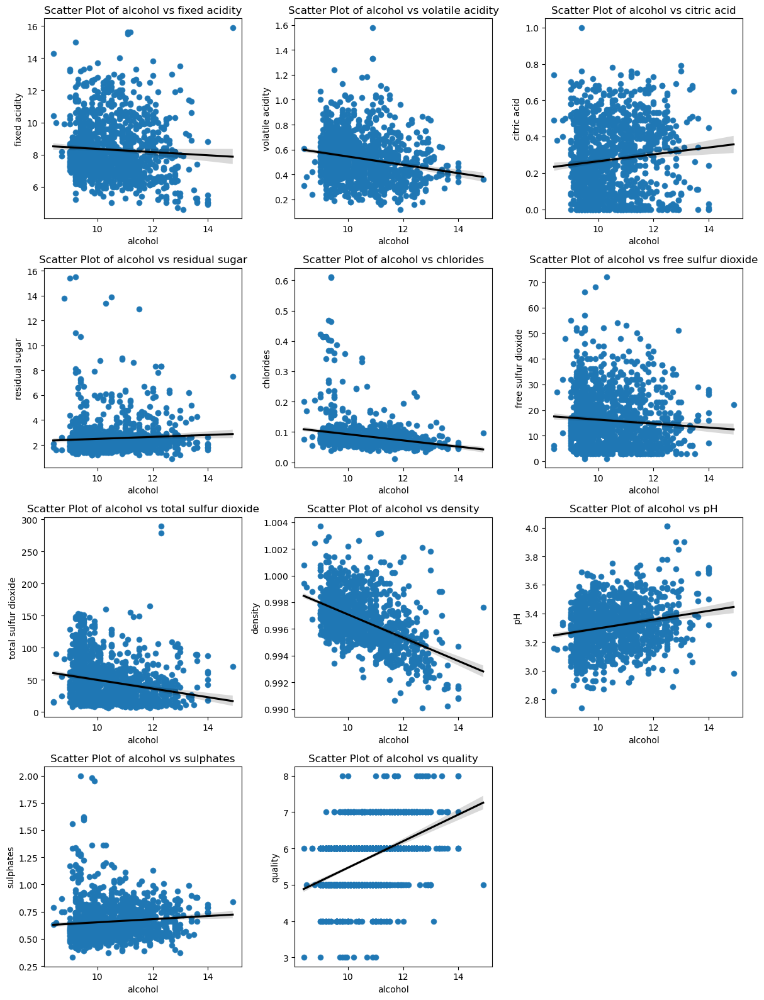

In [92]:
# Code is here
other_columns = [col for col in df.columns if col != 'alcohol']

fig, axes = plt.subplots(4, 3, figsize=(12, 16))

axes = axes.flatten()

for i, col in enumerate(other_columns):
    if i < num_rows * num_cols:
        row = i // num_cols
        col = i % num_cols
        sns.scatterplot(data=df, x='alcohol', y=other_columns[i], ax=axes[i])
        sns.regplot(data=df, x='alcohol', y=other_columns[i], ax=axes[i], line_kws={'color': 'black'})
        axes[i].set_title(f'Scatter Plot of alcohol vs {other_columns[i]}')

if len(other_columns) < len(axes):
    for j in range(len(other_columns), len(axes)):
        fig.delaxes(axes[j])

plt.tight_layout()
plt.show()

**Interesting! It turns out that possible predictors like *sulphates*, *fixed acidity*, *residual sugar*, *free sulfur dioxide* seem not to have linear relationship with a dependent variable!**

Now it's important to check for the correlations between predictor variables and dependent feature and predictor variables in-between. This will give us an opportunity to select best possible features for the linear regression model.

**Interpretation of the correlation coefficients**:

| r | < 0.3 - very weak correlation;

0.3 <= | r | < 0.5 - weak correlation;

0.5 <= | r | < 0.7 - average correlation;

0.7 <= | r | < 0.9 - strong correlation;

0.9 <= | r | <= 1 - very strong correlation;

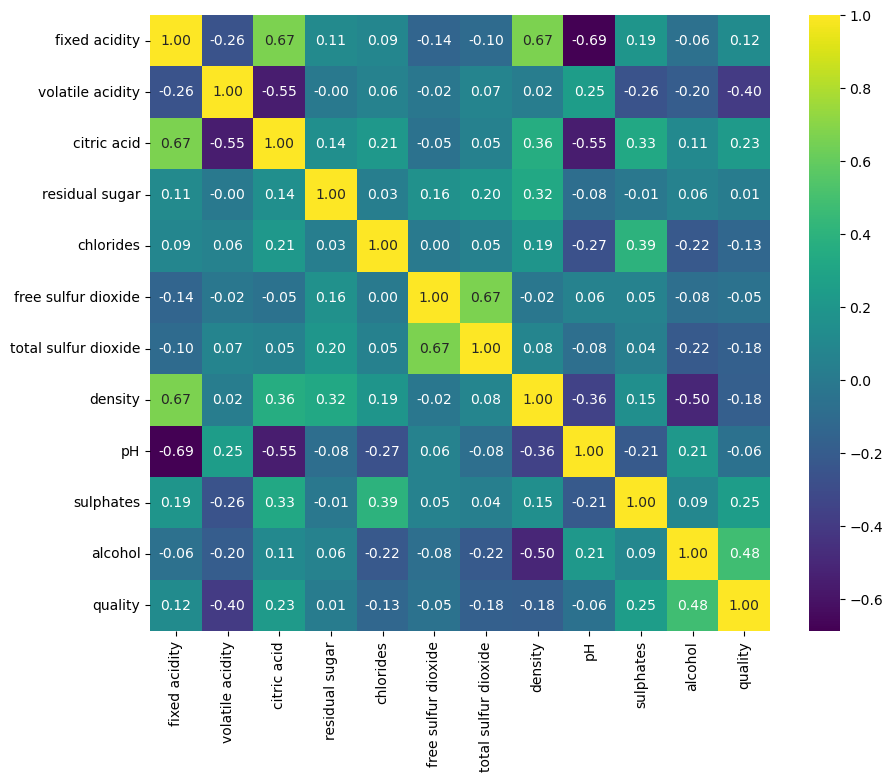

In [96]:
# Code is here
plt.figure(figsize=(10,8))
corr_matrix = df.corr()
sns.heatmap(corr_matrix, cmap="viridis", annot=True, fmt=".2f");

**Almost half features, except *quality*, *pH*, *density*, *total sulfur dioxide*, *chlorides*, *volatile acidity* are weakly correlated to our target variable**.

In [65]:
df.corr()['alcohol'].sort_values(ascending=False)

alcohol                 1.000000
quality                 0.480343
pH                      0.213418
citric acid             0.105108
sulphates               0.091621
residual sugar          0.063281
fixed acidity          -0.061596
free sulfur dioxide    -0.080125
volatile acidity       -0.197812
total sulfur dioxide   -0.217829
chlorides              -0.223824
density                -0.504995
Name: alcohol, dtype: float64

**Multicolinearity** is possible between **fixed acidity and pH, fixed acidity and citric acid, fixed acidity and density**, **free sulfur dioxide and total sulfur dioxide**, because correlation coefficients are the highest.

**Conclusion**: it's likely that half of the features will not contribute significantly to the model. It is important to check further for multicolinearity between previously mentioned features.

## Analysis of multicolinearity.

Let's calculate Variance Inflation Factors for the features to check for possible multicolinearity. **VIF** <= 4 is accepted.

In [111]:
# Code is here
from statsmodels.stats.outliers_influence import variance_inflation_factor

numeric_predictors = df.drop(columns=['alcohol'])

X = sm.add_constant(numeric_predictors)

vif_data = pd.DataFrame()
vif_data["Variable"] = X.columns
vif_data["VIF"] = [variance_inflation_factor(X.values, i) for i in range(X.shape[1])]

print(vif_data)

                Variable            VIF
0                  const  799036.037807
1          fixed acidity       5.667295
2       volatile acidity       1.848316
3            citric acid       3.072179
4         residual sugar       1.258784
5              chlorides       1.547892
6    free sulfur dioxide       1.951399
7   total sulfur dioxide       2.227516
8                density       2.914046
9                     pH       2.492248
10             sulphates       1.444479
11               quality       1.465693


**Interesting! It turns out that fixed acidity might indeed cause multicolinearity issues, because its VIF score is above 4, so it will not be added to the regression model.**

## Outlier detection and analysis.

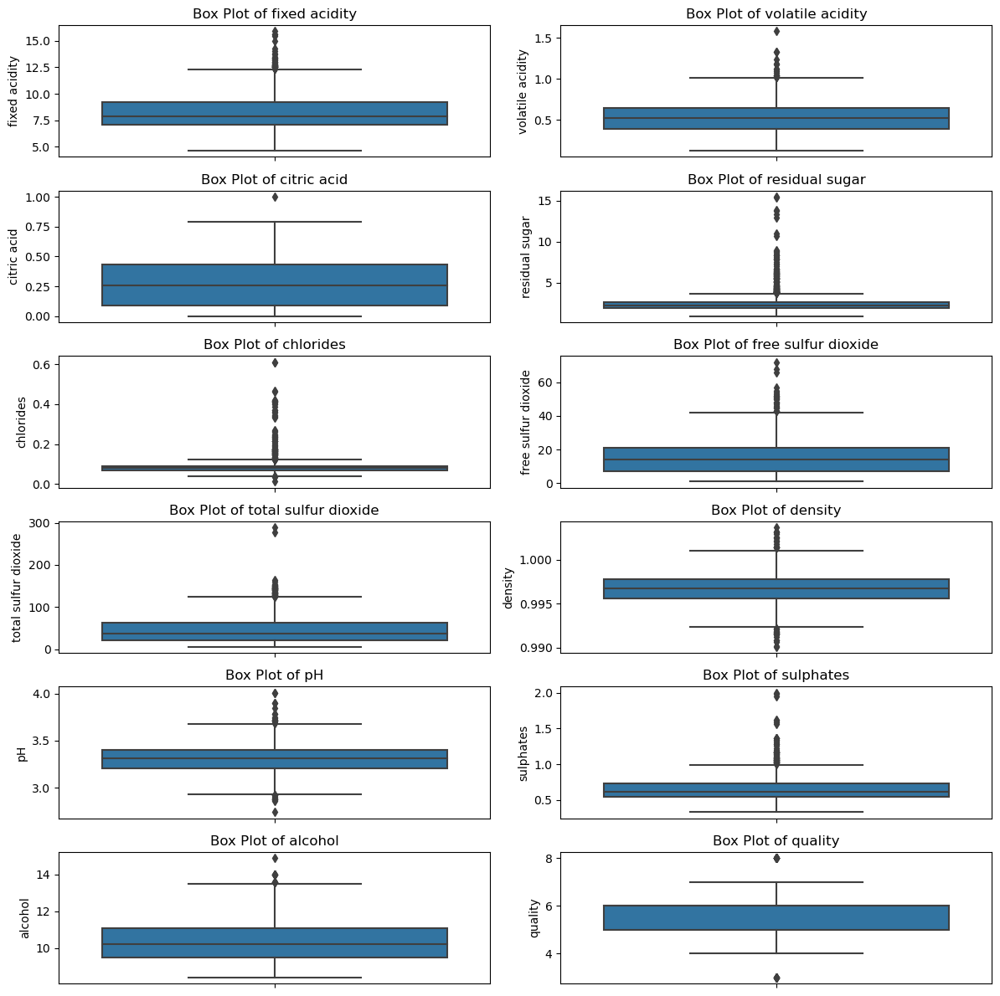

In [116]:
# Code here
fig, axes = plt.subplots(6, 2, figsize=(12, 12))

axes = axes.flatten()

for i, column in enumerate(df.columns):
    ax = axes[i]
    sns.boxplot(data=df, y=column, ax=ax)
    ax.set_title(f'Box Plot of {column}')

plt.tight_layout()

plt.show()

**Features like residual sugar, chlorides, total sulfur dioxide has data points that 3x exceed upper whisker limits** However it's worth noting, that the origin of these outliers might be that these are extreme characteristics, rather than data entry errors. In this instance the outliers will be kept for the modelling.

In [158]:
# For experimentation purposes let's create a copy of a dataframe without mentioned features.

df_copy2 = df.drop(columns=['residual sugar', 'chlorides', 'total sulfur dioxide', 'fixed acidity'])
df_copy2.head(2)

,volatile acidity,citric acid,free sulfur dioxide,density,pH,sulphates,alcohol,quality
0,0.70,0.0,11.0,0.9978,3.51,0.56,9.4,5
1,0.88,0.0,25.0,0.9968,3.20,0.68,9.8,5


# Linear Regression models.

In this part I will do regression analysis for the *alcohol* column. The predictor variables for the first model will be all features, except **fixed acidity**.

In [124]:
df1 = df.drop(columns=['fixed acidity'], axis=1)
df1.head(2)

,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,quality
0,0.70,0.0,1.9,0.076,11.0,34.0,0.9978,3.51,0.56,9.4,5
1,0.88,0.0,2.6,0.098,25.0,67.0,0.9968,3.20,0.68,9.8,5


To determine if the Linear Regression Model is well designed it's important to check the significance of individual predictors in a Linear Regression Model. Hereby such Hypothesis are raised:

**Target Population**: Individual Features in the Wine Quality Dataset.  

**Parameter of Interest**: $p$ value of the Stjudents criterion (t-values) for the regression coefficients. 

**Null Hypothesis:** $p$ > 0.05, predictor has no significant effect on the dependent variable. 

**Alternative Hypthosis:** $p$ < 0.05, predictor has significant effect on the dependent variable. 

In [174]:
X = df1.drop(columns=['alcohol'], axis=1)
X = sm.add_constant(X)
y = df1['alcohol']

lr1 = sm.OLS(y, X).fit()

print(lr1.summary())

                            OLS Regression Results                            
Dep. Variable:                alcohol   R-squared:                       0.587
Model:                            OLS   Adj. R-squared:                  0.584
Method:                 Least Squares   F-statistic:                     191.7
Date:                Wed, 20 Sep 2023   Prob (F-statistic):          1.24e-250
Time:                        15:00:35   Log-Likelihood:                -1434.0
No. Observations:                1359   AIC:                             2890.
Df Residuals:                    1348   BIC:                             2947.
Df Model:                          10                                         
Covariance Type:            nonrobust                                         
                           coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------------------------
const                  347.1365 

**Insights of the model**:
1. For all instances, except Free Sulfur Dioxide we can reject 0 hypothesis and confirm that most of the features are significantly contributing to the model.
2. Free sulfur dioxide feature seems to be insignificant, also it was redundant to total sulfur dioxide and they were correlated.
3. Model accuracy is acceptable and low F-statistic probability indicate that it's overall significant.

Whilst ignoring all warnings, we will repeat regression without insignificant feature.

In [134]:
X = df1.drop(columns=['alcohol', 'free sulfur dioxide'], axis=1)
X = sm.add_constant(X)
y = df1['alcohol']

lr1 = sm.OLS(y, X).fit()

print(lr1.summary())

                            OLS Regression Results                            
Dep. Variable:                alcohol   R-squared:                       0.587
Model:                            OLS   Adj. R-squared:                  0.584
Method:                 Least Squares   F-statistic:                     212.9
Date:                Wed, 20 Sep 2023   Prob (F-statistic):          1.38e-251
Time:                        12:18:16   Log-Likelihood:                -1434.5
No. Observations:                1359   AIC:                             2889.
Df Residuals:                    1349   BIC:                             2941.
Df Model:                           9                                         
Covariance Type:            nonrobust                                         
                           coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------------------------
const                  347.1524 

**R-squared has not changed much. However it's time to check for the assumptions of the LR model:**
1. Residuals are independent (mean of zero).
2. Residuals are normally distributed.
3. Residuals have constant variance (homoskedastic).

## Independence of residuals and homoskedasticity.

Using a scatterplot of residuals and predicted values let's analyze:
- Independence of residuals. They need to be randomly scattered around y=0.
- Homoskedasticity (constant variance of residuals).

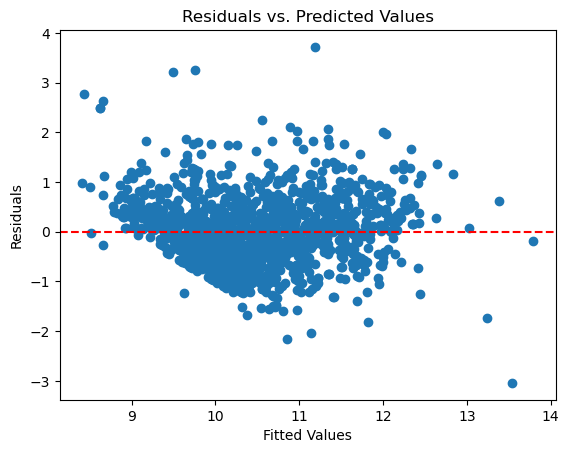

In [178]:
# Code is here
residuals = lr1.resid

plt.scatter(lr1.fittedvalues, residuals)
plt.xlabel("Fitted Values")
plt.ylabel("Residuals")
plt.title("Residuals vs. Predicted Values")
plt.axhline(y=0, color='r', linestyle='--')
plt.show()

**Conclusion**:
- Residuals are independent and scattered around zero. Durbin-Warson test statistic (1.66) also approves that there is no auto-correlation.
- Residuals are scattered equally (except some outliers) around X and Y axis.

## Normality of residuals.

Using a histogram and Q-Q plot let's analyze the distribution of residuals.

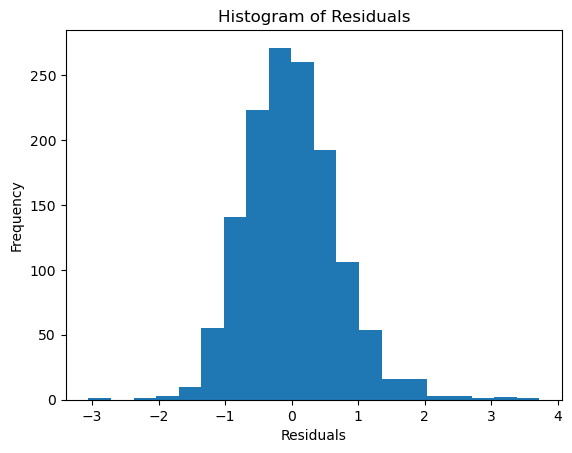

In [141]:
# Code is here
plt.hist(residuals, bins=20)
plt.xlabel("Residuals")
plt.ylabel("Frequency")
plt.title("Histogram of Residuals")
plt.show()

**While histogram of the residuals look normally distributed it's worth taking a look at the Q-Q plot for the residual distribution.**

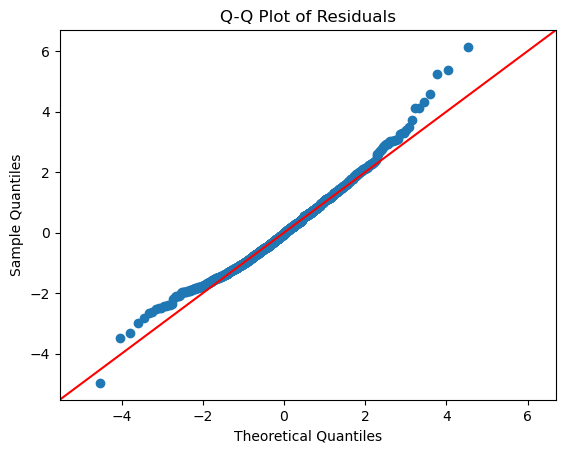

In [173]:
sm.qqplot(residuals, stats.t, fit=True, line='45')
plt.title("Q-Q Plot of Residuals")
plt.show()

**Conclusion** - Residuals are slightly departed from the normality, however since sample size is large enough this assumption can be overlooked.

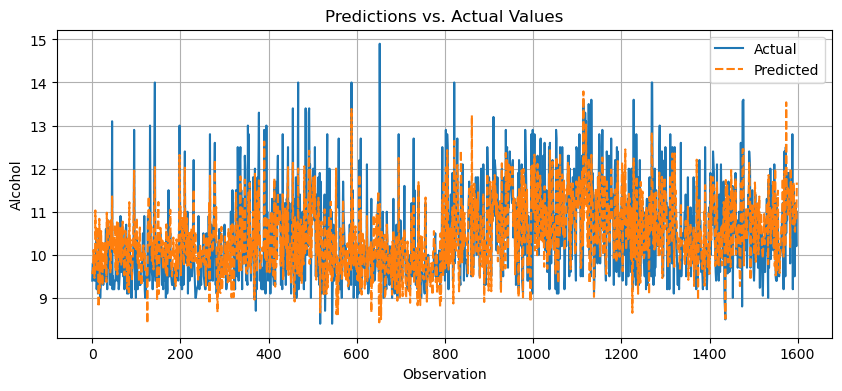

In [177]:
# Code is here
predicted_values = lr1.predict(X)

plt.figure(figsize=(10, 4))
sns.lineplot(data=pd.DataFrame({'Actual': y, 'Predicted': predicted_values}))
plt.xlabel('Observation')
plt.ylabel('Alcohol')
plt.title('Predictions vs. Actual Values')
plt.grid(True)
plt.show()

**Overall conclusion** - created Multiple Linear Regression model is significant and has an accuracy of 59 %. While residual normality slightly deviates from normality, sample size is large enough, other assumptions satisfy the requirements for linear regression.

**Equation for final Linear Regression Model.**

**alcohol** = 347.1524 + 0.9421  ×$volatile$ $acidity$ + 2.3237 × $citric$ $acid$ + 0.2035 × $residual$ $sugar$−3.7665 × $chlorides$ − 0.0062 × $total$ $sulfur$ $dioxide$ − 345.8698 × $density$ + 1.3683 × $pH$ + 0.8827 × $sulphates$ +0.3336 × $quality$.

## Special case for linear regression

For the exploration purposes, let's check what would have happened if we were to keep all the original features.

In [166]:
# Code here
X1 = df.drop(columns=['alcohol'], axis=1)
X1 = sm.add_constant(X1)
y1 = df1['alcohol']

lr2 = sm.OLS(y1, X1).fit()

print(lr2.summary())

                            OLS Regression Results                            
Dep. Variable:                alcohol   R-squared:                       0.703
Model:                            OLS   Adj. R-squared:                  0.701
Method:                 Least Squares   F-statistic:                     290.0
Date:                Wed, 20 Sep 2023   Prob (F-statistic):               0.00
Time:                        13:06:34   Log-Likelihood:                -1209.8
No. Observations:                1359   AIC:                             2444.
Df Residuals:                    1347   BIC:                             2506.
Df Model:                          11                                         
Covariance Type:            nonrobust                                         
                           coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------------------------
const                  568.2696 

In [167]:
# Code is here
vif = pd.DataFrame()
vif["Variable"] = X1.columns
vif["VIF"] = [variance_inflation_factor(X1.values, i) for i in range(X1.shape[1])]

# Print the VIF values
print(vif)

                Variable            VIF
0                  const  799036.037807
1          fixed acidity       5.667295
2       volatile acidity       1.848316
3            citric acid       3.072179
4         residual sugar       1.258784
5              chlorides       1.547892
6    free sulfur dioxide       1.951399
7   total sulfur dioxide       2.227516
8                density       2.914046
9                     pH       2.492248
10             sulphates       1.444479
11               quality       1.465693


**It seems that model with the *Fixed Acidity* feature, has Multicolinearity issues and two additional features are also insignificant. Also important to point out that the ratio of explained variance (R-squared) now increased to 0.70.**

**Overall it was a good decision to proceed with a stable and reliable, although less accurate model**.

# Binary Classification.

In this part all of the analysis will be centered around **quality** feature. It is of a ordinal categorical nature, so prior to statistical modelling its worthy to analyze how it is related to other features. Ultimately we will focus on creating reliable model for a classification task.

## Univariate Analysis (Quality Feature)

In [202]:
df.quality.describe()

count    1359.000000
mean        5.623252
std         0.823578
min         3.000000
25%         5.000000
50%         6.000000
75%         6.000000
max         8.000000
Name: quality, dtype: float64

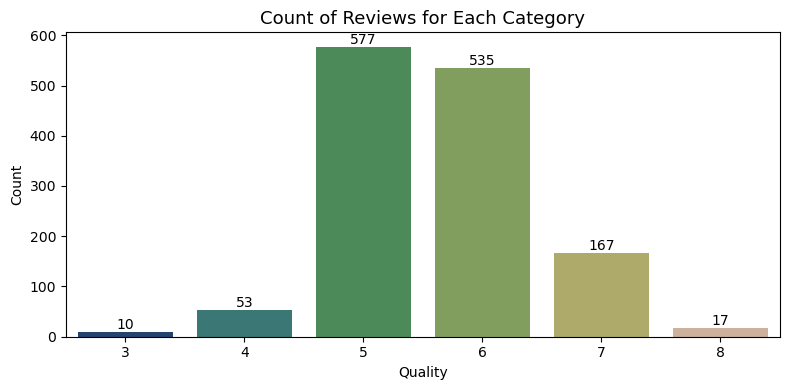

In [201]:
# Code is here
plt.figure(figsize=(8, 4))
ax = sns.countplot(x="quality", data=df, palette="gist_earth")
plt.title("Count of Reviews for Each Category", fontsize=13)
plt.xlabel("Quality")
plt.ylabel("Count")

ax.bar_label(ax.containers[0], fmt="%d", label_type="edge")

plt.tight_layout()

plt.show()

**Things to conclude**:
- 3/4 of wines are of a quality 6 or below;
- Mean quality as between 5 and 6.
- 1 % of wines are of a best quality.

## Bivariate Analysis (Quality Feature)

First let's analyze barplots of how related wine quality is to each feature.

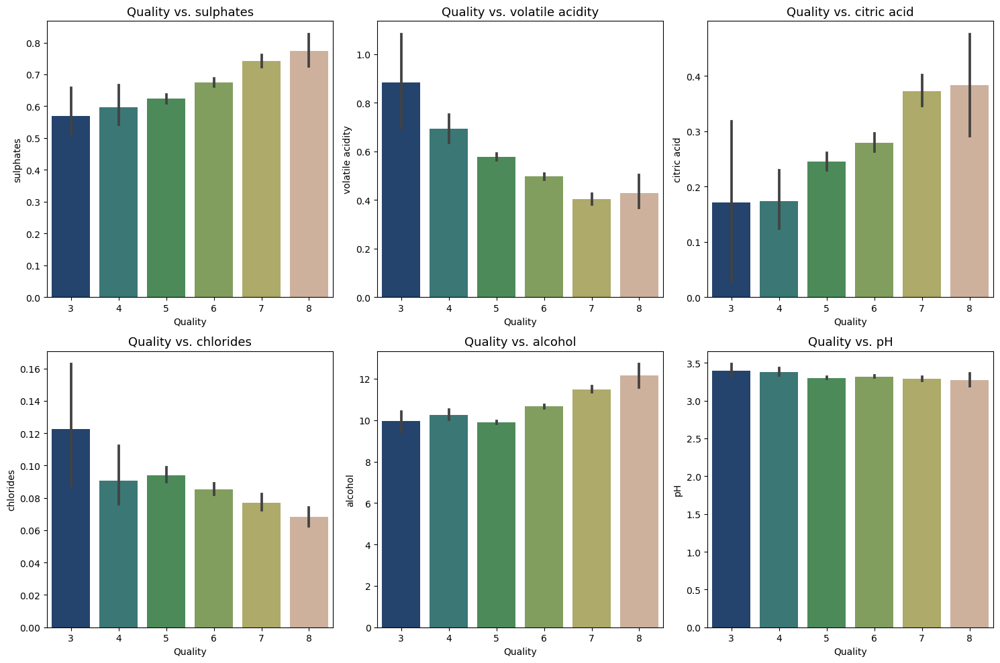

In [224]:
# Code is here
columns_to_plot = ['sulphates', 'volatile acidity', 'citric acid', 'chlorides', 'alcohol', 'pH']

fig, axes = plt.subplots(2, 3, figsize=(15, 10))
fig.subplots_adjust(hspace=0.5)

for i, column in enumerate(columns_to_plot):
    row, col = divmod(i, 3)
    sns.barplot(x='quality', y=column, data=df, ax=axes[row, col], palette="gist_earth")
    axes[row, col].set_title(f"Quality vs. {column}", fontsize=13)
    axes[row, col].set_xlabel("Quality")
    axes[row, col].set_ylabel(column)

plt.tight_layout()

plt.show()


**Interesting!** It turn out that:
- Quality has positive correlation with the amount of sulphates, citric acid, alcohol level.
- Quality has negative correlation with the volatile acidity, chlorides, pH levels.

**Finally let's take a look at the actual correlation coefficients between dependent and independent features.**

In [249]:
df.corr()['quality'].sort_values(ascending=False)

quality                 1.000000
alcohol                 0.480343
sulphates               0.248835
citric acid             0.228057
fixed acidity           0.119024
residual sugar          0.013640
free sulfur dioxide    -0.050463
pH                     -0.055245
chlorides              -0.130988
total sulfur dioxide   -0.177855
density                -0.184252
volatile acidity       -0.395214
Name: quality, dtype: float64

## Feature Engineering (Quality Feature)

At this stage of learning I've been learning how to implement logistic regression for binary dependent variable. For this, I will need to decide a threshold how I will divide my data. Obviously the Wine Quality will be divided into 'Good' and 'Poor'.

Very important note is that, if we want to create a realiable model each class (binary) needs to have sufficient amount of data. If I only used the labels of 7 and 8 to classify as a good wine, then this class would account only for 12 % of a data (what is insufficient). 

General guideline for this is to have at least 20% of a data in one of the classes, so for this instance quality of **6-7-8** will be considered as a good wine.

In [9]:
df_log = df.copy()
df_log['quality_enc'] = df_log["quality"].replace({3: 0, 4: 0, 5: 0, 6: 1, 7: 1, 8: 1})
df_log.drop('quality', axis=1, inplace=True)
df_log.quality_enc.value_counts()

1    719
0    640
Name: quality_enc, dtype: int64

## Logistic Regression Model

Logistic regression is used, when target variable is categorical. Comparing to Linear Regression: Rather than predicting actual values, Logistic Regression predicts the log odds of an event happening. These log odds represent the likelihood of a certain category.

For the Logistic Regression we will avoid using **fixed acidity** feature, because it has had signs of multicolinearity with other features.

**Let's create a Multiple Logistic Regression and evaluate it's performance**. For this task I will use scikit-learn library, because this model does not require extensive analysis of the different assumptions.

Main metric, used to evaluate a classification model is going to be classification report and confusion matrix. 
Instead of R-squared (which is designated to calculate how much of a variance is explained and overall more used for explanatory reasons) we will use F-1 score which is calculated out of Precision and Recall metrics.

$Precision$:
TP / (TP + FP)

$Recall$:
TP / (TP + FN)

In [35]:
# Code is here
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LogisticRegression
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import classification_report, confusion_matrix, accuracy_score
from sklearn.metrics import plot_confusion_matrix

### First method - with original features.

In this section I will use the original dimensions of the features, that are not Scaled.

In [21]:
df_log.columns

Index(['fixed acidity', 'volatile acidity', 'citric acid', 'residual sugar',
       'chlorides', 'free sulfur dioxide', 'total sulfur dioxide', 'density',
       'pH', 'sulphates', 'alcohol', 'quality_enc'],
      dtype='object')

In [83]:
# Code is here
X = df_log.drop(columns=['quality_enc', 'fixed acidity'], axis=1)
y = df_log['quality_enc']

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)
logistic_model = LogisticRegression(random_state=42)
logistic_model.fit(X_train, y_train)

y_pred = logistic_model.predict(X_test)

print("Classification Report:\n", classification_report(y_test, y_pred))
print("Accuracy Score:", accuracy_score(y_test, y_pred))

Classification Report:
               precision    recall  f1-score   support

           0       0.77      0.73      0.75       135
           1       0.75      0.78      0.76       137

    accuracy                           0.76       272
   macro avg       0.76      0.76      0.76       272
weighted avg       0.76      0.76      0.76       272

Accuracy Score: 0.7573529411764706


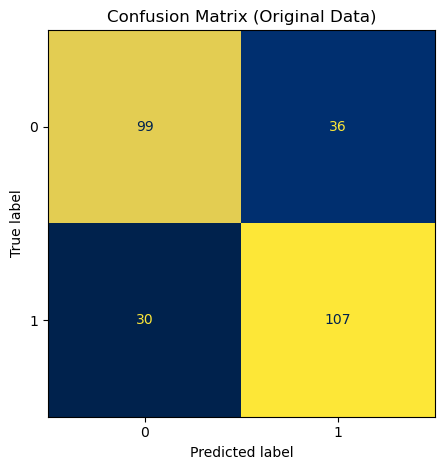

In [85]:
# Code is here
plot_confusion_matrix(logistic_model,X_test,y_test,cmap='cividis',colorbar=False)
plt.title('Confusion Matrix (Original Data)')
plt.tight_layout()
plt.show()

**Interesting!** Model is almost equaly good at distinguishing between two classes and it performs almost equally well for them. Accuracy score of 75 % is pretty good at the first try.

Now let's try scaling our features. Scalling slightly reduces the impact of the outliers by centering all values around mean and dividing by the standard deviation.

**Second method - with a Standard Scaler applied.**

In [72]:
# Code is here
from sklearn.preprocessing import StandardScaler

scaler = StandardScaler()

X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)
logistic_model.fit(X_train_scaled, y_train)

y_pred = logistic_model.predict(X_test_scaled)

print("Classification Report:\n", classification_report(y_test, y_pred))
print("Accuracy Score:", accuracy_score(y_test, y_pred))

Classification Report:
               precision    recall  f1-score   support

           0       0.78      0.73      0.75       135
           1       0.75      0.80      0.77       137

    accuracy                           0.76       272
   macro avg       0.76      0.76      0.76       272
weighted avg       0.76      0.76      0.76       272

Accuracy Score: 0.7610294117647058


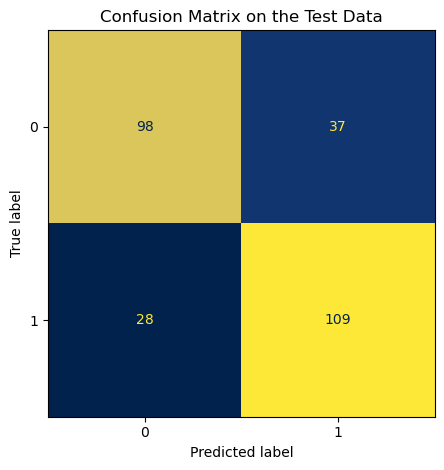

In [78]:
# Code is here
plot_confusion_matrix(logistic_model,X_test_scaled,y_test,cmap='cividis',colorbar=False)
plt.title('Confusion Matrix on the (Scaled Data')
plt.tight_layout()
plt.show()

**Model has slightly improved! Now it's more accurate at classifying for the Class 1 (Wine quality 6-8)**

Cross validation or hyper parameter tuning is not under the scope of this project, so all these actions will be performed during Module 2 Capstone project.

# Google Looker Studio Dashboard.

In [54]:
def mappings(x):
    if x < 8.5:
        return 8
    elif 8.5 <= x < 9.5:
        return 9
    elif 9.5 <= x < 10.5:
        return 10
    elif 10.5 <= x < 11.5:
        return 11
    elif 11.5 <= x < 12.5:
        return 12
    elif 12.5 <= x < 13.5:
        return 13
    elif 13.5 <= x < 14.5:
        return 14
    elif 14.5 <= x < 15.5:
        return 15
    else:
        return None
    
df1['alcohol'] = df1['alcohol'].map(mappings)

In [63]:
df1.to_csv('df1.csv', index=False)

[Link to the Dashboard](https://lookerstudio.google.com/s/pT2jUaycMxs)

# References

1. Medium, https://medium.com/@setumo/linear-regression-assumptions-9c1f13087333
2. Cekanavicius V., Murauskas G., Applied regression analysis. Vilnius University, 2014., http://www.statistika.mif.vu.lt/wp-content/uploads/2014/04/regresine-analize.pdf#page42

# General Conclusions.

- None of the attributes in the dataset follow a normal (Gaussian) distribution;
- There are no regressors that have high or very high correlation with target variables (alcohol, quality).
- Due to Multicolinearity issue *Fixed Acidity* is not used in the predictive models.
- Many attributes have outliers, however these are related to the extreme values rather than data entry errors. I decided to preserve outliers;
- Due to insignificance *Free Sulfur Dioxide* attribute has been removed from the Linear Regression Model.
- With a slight violation in residual normality, all linear regression model assumptions were met and models **R-squared is 59 %**.
- Feature scalling has improved Logistic Regression model to classify target variable. Its **F1-score has been 76%**.

<img src="https://t3.ftcdn.net/jpg/02/91/52/22/240_F_291522205_XkrmS421FjSGTMRdTrqFZPxDY19VxpmL.jpg" alt="study" width="400">
